In [1]:
import numpy as np
import sklearn
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
import scipy.stats as stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
import math
import pylab 
from sklearn.linear_model import  LassoLarsIC

In [2]:

data = pd.read_csv('bank.csv', sep = ',')

data.dropna()
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


## Description:
#### Customer data:
1 - age: age <br>
2 - job: type of job (administrator, worker, entrepreneur, maid, manager, pensioner, self-employed, service industry, student, technician, unemployed, unknown) <br>
3 - marital: marital status (divorced, married, not married, unknown; Note: "divorced" means divorced or widowed) <br>
4 - education: education (primary, secondary, higher and unknown) <br>
5 - default: has default credit? (no, yes, unknown.) <br>
6 - housing: is there a mortgage? (no, yes, unknown.) <br>
7 - loan: is there a personal loan? (no, yes, unknown.) <br>
8 - balance: balance.

#### Data on the last contact within the campaign:
9 - contact: type of contact ("cellular", "phone") <br>
10 - month: last contact month ('jan', 'feb', 'mar', ..., 'nov', 'dec') <br>
11 - day: last contact day of the week ('mon', 'tue', 'wed', 'thu', 'fri') <br>
12 - duration: duration of the last contact, in seconds <br>

#### Others:
13 - campaign: the number of contacts made during this campaign for this client (includes the last contact) <br>
14 - pdays: the number of days since the last contact with the customer from the previous campaign (999 means that the customer has not previously contacted) <br>
15 - previous: number of contacts made before this campaign for this client <br>
16 - poutcome: the result of a previous marketing campaign ("failure", "nonexistent", "success") <br>
17 - deposit: Has the client agreed to issue a term deposit? ("well no")

In [3]:
# Highlight predictors
X = data[['balance', 'day','duration','campaign','pdays','previous']]
# Allocate the target variable
y = data[['age']]
# Division into training and test samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

x = []
for i in range(len(y_test)):
    x.append(i)
# Create a linear regression model
reg = LinearRegression(normalize=True)
# Train a linear regression model
reg.fit(X_train, y_train)
# Forecast on a test sample
y_pred = reg.predict(X_test)
params = np.append(reg.intercept_,reg.coef_)

In [4]:
# Calculate regression metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print('Mean absolute error = ', mae)
print('Mean squared error = ', mse)

Mean absolute error =  9.773941093456006
Mean squared error =  144.22495053994476


In [5]:
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)
print('Mean absolute percentage error = ', mape)

Mean absolute percentage error =  age    25.074912
dtype: float64


In [6]:
# Lasso regularization
clf = linear_model.Lasso(alpha=0.1)
clf.fit(X_train, y_train)
print(clf.coef_)

[ 4.09535182e-04  6.25021839e-03  4.74713253e-05 -0.00000000e+00
 -1.56071805e-04 -0.00000000e+00]


In [7]:
model_aic = LassoLarsIC(criterion='aic')
model_aic.fit(X_train, y_train)
alpha_aic_ = model_aic.coef_
alpha_aic_

C:\Users\anaxa\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


array([0.00038934, 0.        , 0.        , 0.        , 0.        ,
       0.        ])

In [8]:
y_pred_lasso = clf.predict(X_test)
y_pred_lasso_aic = model_aic.predict(X_test)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
mae_lasso_aic = mean_absolute_error(y_test, y_pred_lasso_aic)
print('Mean absolute error with lasso = ', mae_lasso)
print('Mean squared error with lasso = ', mse_lasso)
print('Mean absolute error with aic lasso = ', mae_lasso_aic)


Mean absolute error with lasso =  9.773172900606667
Mean squared error with lasso =  144.22109656176238
Mean absolute error with aic lasso =  9.773685508888896


Text(0, 0.5, 'Age')

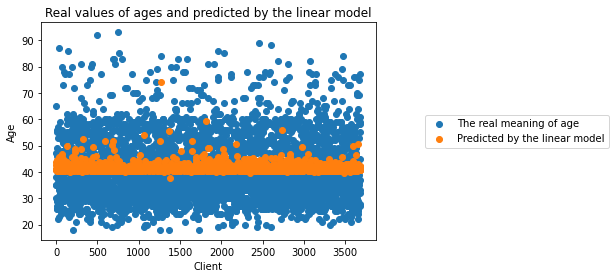

In [9]:
#graph of real and predicted values
plt.scatter(x, y_test, label = u'The real meaning of age')
plt.scatter(x, y_pred, label = u'Predicted by the linear model')
plt.title(u'Real values of ages and predicted by the linear model')
plt.legend(loc="center right",borderaxespad=0.1, bbox_to_anchor=(1.7, 0.5))
plt.xlabel(u'Client')
plt.ylabel(u'Age')

<ipython-input-10-785261d40eaf>:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


<AxesSubplot:>

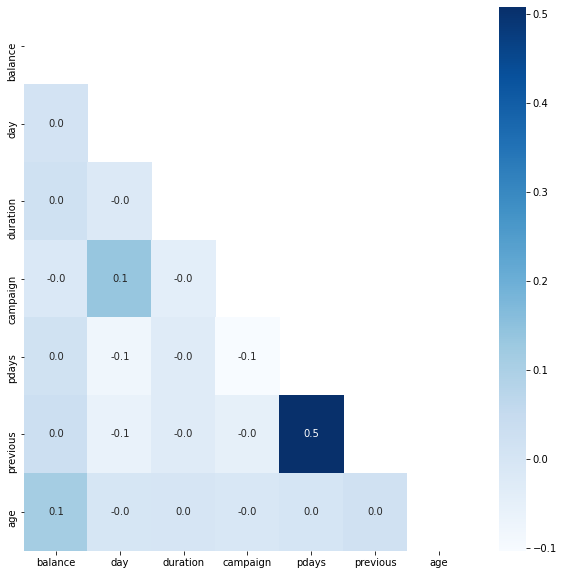

In [10]:
# Building a correlation matrix of features
dataset = data[['balance', 'day','duration','campaign','pdays','previous','age']]
corr = dataset.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(10, 10))

sns.heatmap(corr, mask = mask, annot=True, fmt= '.1f', ax = ax, cmap = 'Blues')

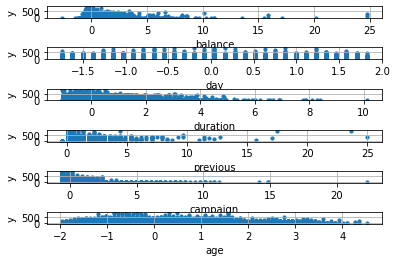

In [11]:
# Visualization of the dependence of features among themselves
X = data[['balance', 'day','duration','previous','campaign','age']]
scaler = StandardScaler()
y = data[['pdays']]
X = pd.DataFrame(scaler.fit_transform(X))
X.columns = ['balance', 'day','duration','previous','campaign','age']

# Creation of subplot - several charts in one picture
fig, axs = plt.subplots(6, 1)
plt.subplots_adjust(wspace=0, hspace=2.5)
axs[0].scatter(X[['balance']],y,s=10)
axs[0].set_xlabel('balance')
axs[0].set_ylabel('y')
axs[0].grid(True)

axs[1].scatter(X[['day']],y,s=10)
axs[1].set_xlabel('day')
axs[1].set_ylabel('y')
axs[1].grid(True)

axs[2].scatter(X[['duration']],y,s=10)
axs[2].set_xlabel('duration')
axs[2].set_ylabel('y')
axs[2].grid(True)

axs[3].scatter(X[['previous']],y,s=10)
axs[3].set_xlabel('previous')
axs[3].set_ylabel('y')
axs[3].grid(True)

axs[4].scatter(X[['campaign']],y,s=10)
axs[4].set_xlabel('campaign')
axs[4].set_ylabel('y')
axs[4].grid(True)

axs[5].scatter(X[['age']],y,s=10)
axs[5].set_xlabel('age')
axs[5].set_ylabel('y')
axs[5].grid(True)

In [12]:
# Selection of the three most significant features
X = data[['balance','duration','previous']]
# Normalization of features
scaler = StandardScaler()
y = data[['pdays']]
X = pd.DataFrame(scaler.fit_transform(X))
X.columns = ['balance','duration','previous']
scaler = StandardScaler()
y = pd.DataFrame(scaler.fit_transform(y))
y.columns = ['pdays']
# Division into test and training samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
# Create and train a linear regression model
reg = LinearRegression(normalize=True)
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
y_pred_all = np.array(reg.predict(X))


In [13]:
# Calculation of model metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print('Mean absolute error = ', mae)
print('Mean squared error = ', mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
print('Mean absolute percentage error = ', mape)

Mean absolute error =  0.5293072722335417
Mean squared error =  0.7746950231264432
Mean absolute percentage error =  pdays    71.944929
dtype: float64


Text(0, 0.5, 'Prediction')

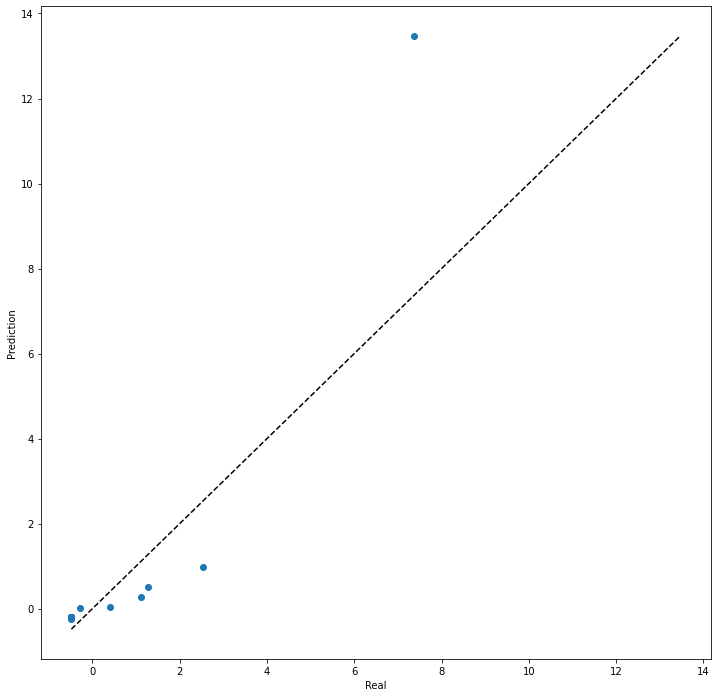

In [14]:
# Plotting a quantile biplot based on real and predicted values
percs = np.linspace(0, 100, 21)
qn_first = np.percentile(y, percs)
qn_second = np.percentile(y_pred_all, percs)
plt.figure(figsize=(12, 12))

min_qn = np.min([qn_first.min(), qn_second.min()])
max_qn = np.max([qn_first.max(), qn_second.max()])
x = np.linspace(min_qn, max_qn)

plt.plot(qn_first, qn_second, ls="", marker="o", markersize=6)
plt.plot(x, x, color="k", ls="--")

plt.xlabel(u'Real')
plt.ylabel(u'Prediction')

Text(0, 0.5, 'pdays')

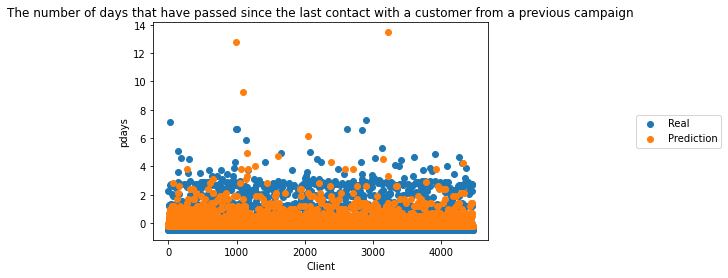

In [15]:
x = []

for i in range(len(y_test)):
    x.append(i)
# Graph of real and predicted values
plt.scatter(x, y_test, label = u'Real')
plt.scatter(x, y_pred, label = u'Prediction')
plt.title(u'The number of days that have passed since the last contact with a customer from a previous campaign')
plt.legend(loc="center right",borderaxespad=0.1, bbox_to_anchor=(1.7, 0.5))
plt.xlabel(u'Client')
plt.ylabel('pdays')

In [16]:
#Построение и обучение полиномиальной регрессии 2-й степени
poly = PolynomialFeatures(2)
X_train_new = poly.fit_transform(X_train)
poly = PolynomialFeatures(2)
X_test_new = poly.fit_transform(X_test)
reg = LinearRegression(normalize=True)
reg.fit(X_train_new, y_train)
y_pred_poly = reg.predict(X_test_new)
X_new = poly.fit_transform(X)
y_pred_poly_all = reg.predict(X_new)

Text(0, 0.5, 'Prediction')

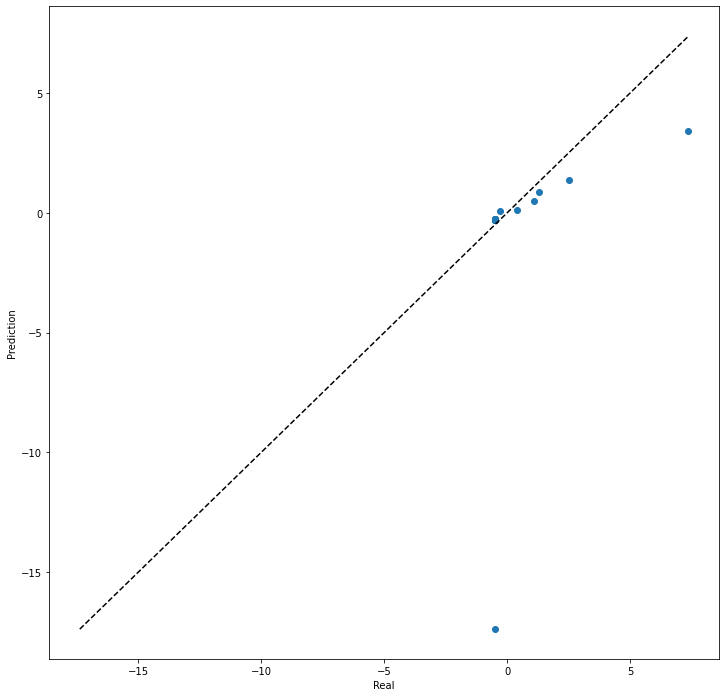

In [17]:
# Plotting a quantile biplot based on real and predicted values
percs = np.linspace(0, 100, 21)
qn_first = np.percentile(y, percs)
qn_second = np.percentile(y_pred_poly_all , percs)
plt.figure(figsize=(12, 12))

min_qn = np.min([qn_first.min(), qn_second.min()])
max_qn = np.max([qn_first.max(), qn_second.max()])
x = np.linspace(min_qn, max_qn)

plt.plot(qn_first, qn_second, ls="", marker="o", markersize=6)
plt.plot(x, x, color="k", ls="--")

plt.xlabel(u'Real')
plt.ylabel(u'Prediction')

In [18]:

mae_poly = mean_absolute_error(y_test, y_pred_poly)
mse_poly = mean_squared_error(y_test, y_pred_poly)
print('Mean absolute error with Polynomial model = ', mae_poly)
print('Mean squared error with Polynomial model = ', mse_poly)

Mean absolute error with Polynomial model =  0.4571134396682692
Mean squared error with Polynomial model =  0.8259209715215341


Text(0, 0.5, 'pdays')

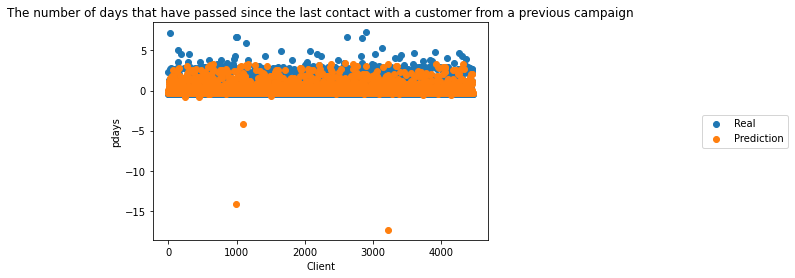

In [19]:
x = []
# Visualization of real and predicted values
for i in range(len(y_test)):
    x.append(i)
plt.scatter(x, y_test, label = u'Real')
plt.scatter(x, y_pred_poly, label = u'Prediction')
plt.title(u'The number of days that have passed since the last contact with a customer from a previous campaign')
plt.legend(loc="center right",borderaxespad=0.1, bbox_to_anchor=(1.9, 0.5))
plt.xlabel(u'Client')
plt.ylabel('pdays')


C:\Users\anaxa\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

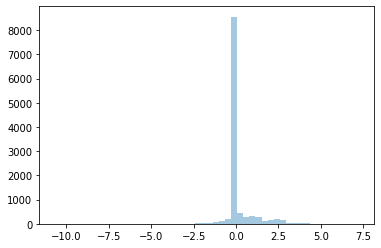

In [20]:
# Plotting the distribution of residuals
y1 = np.array(y)
y2 = np.array(y_pred_all)
y_diff = y1[:,0] - y2[:,0]
sns.distplot(y_diff, kde=False)


In [21]:
#Confidence interval of regression coef 
import numpy as np, statsmodels.api as sm
mod = sm.OLS(y_train, X_train)
res = mod.fit()
print (res.conf_int(0.01))  


                 0         1
balance  -0.023943  0.028196
duration -0.029581  0.024157
previous  0.512225  0.568692
